## Part 1: Pulse Rate Algorithm

### Contents
Fill out this notebook as part of your final project submission.

**You will have to complete both the Code and Project Write-up sections.**
- The [Code](#Code) is where you will write a **pulse rate algorithm** and already includes the starter code.
   - Imports - These are the imports needed for Part 1 of the final project. 
     - [glob](https://docs.python.org/3/library/glob.html)
     - [numpy](https://numpy.org/)
     - [scipy](https://www.scipy.org/)
- The [Project Write-up](#Project-Write-up) to describe why you wrote the algorithm for the specific case.


### Dataset
You will be using the **Troika**[1] dataset to build your algorithm. Find the dataset under `datasets/troika/training_data`. The `README` in that folder will tell you how to interpret the data. The starter code contains a function to help load these files.

1. Zhilin Zhang, Zhouyue Pi, Benyuan Liu, ‘‘TROIKA: A General Framework for Heart Rate Monitoring Using Wrist-Type Photoplethysmographic Signals During Intensive Physical Exercise,’’IEEE Trans. on Biomedical Engineering, vol. 62, no. 2, pp. 522-531, February 2015. Link

-----

### Code

In [172]:
import glob

import numpy as np
import scipy as sp
import scipy.signal
import scipy.io
from matplotlib import pyplot as plt
import mpld3
mpld3.enable_notebook()


def LoadTroikaDataset():
    """
    Retrieve the .mat filenames for the troika dataset.

    Review the README in ./datasets/troika/ to understand the organization of the .mat files.

    Returns:
        data_fls: Names of the .mat files that contain signal data
        ref_fls: Names of the .mat files that contain reference data
        <data_fls> and <ref_fls> are ordered correspondingly, so that ref_fls[5] is the 
            reference data for data_fls[5], etc...
    """
    data_dir = "./datasets/troika/training_data"
    data_fls = sorted(glob.glob(data_dir + "/DATA_*.mat"))
    ref_fls = sorted(glob.glob(data_dir + "/REF_*.mat"))
    return data_fls, ref_fls

def LoadTroikaDataFile(data_fl):
    """
    Loads and extracts signals from a troika data file.

    Usage:
        data_fls, ref_fls = LoadTroikaDataset()
        ppg, accx, accy, accz = LoadTroikaDataFile(data_fls[0])

    Args:
        data_fl: (str) filepath to a troika .mat file.

    Returns:
        numpy arrays for ppg, accx, accy, accz signals.
    """
    data = sp.io.loadmat(data_fl)['sig']
    return data[2:]


def AggregateErrorMetric(pr_errors, confidence_est):
    """
    Computes an aggregate error metric based on confidence estimates.

    Computes the MAE at 90% availability. 

    Args:
        pr_errors: a numpy array of errors between pulse rate estimates and corresponding 
            reference heart rates.
        confidence_est: a numpy array of confidence estimates for each pulse rate
            error.

    Returns:
        the MAE at 90% availability
    """
    # Higher confidence means a better estimate. The best 90% of the estimates
    #    are above the 10th percentile confidence.
    percentile90_confidence = np.percentile(confidence_est, 10)

    # Find the errors of the best pulse rate estimates
    best_estimates = pr_errors[confidence_est >= percentile90_confidence]

    # Return the mean absolute error
    return np.mean(np.abs(best_estimates))

def Evaluate():
    """
    Top-level function evaluation function.

    Runs the pulse rate algorithm on the Troika dataset and returns an aggregate error metric.

    Returns:
        Pulse rate error on the Troika dataset. See AggregateErrorMetric.
    """
    # Retrieve dataset files
    data_fls, ref_fls = LoadTroikaDataset()
    errs, confs = [], []
    for data_fl, ref_fl in zip(data_fls, ref_fls):
        # Run the pulse rate algorithm on each trial in the dataset
        errors, confidence = RunPulseRateAlgorithm(data_fl, ref_fl)
        errs.append(errors)
        confs.append(confidence)
        # Compute aggregate error metric
    errs = np.hstack(errs)
    confs = np.hstack(confs)
    return AggregateErrorMetric(errs, confs)

def RunPulseRateAlgorithm(data_fl, ref_fl):
    # Load data using LoadTroikaDataFile
    ppg, accx, accy, accz = LoadTroikaDataFile(data_fl)

    # Compute pulse rate estimates and estimation confidence.

    # Return per-estimate mean absolute error and confidence as a 2-tuple of numpy arrays.
    errors, confidence = np.ones(100), np.ones(100)  # Dummy placeholders. Remove
    return errors, confidence

In [173]:
# all signals sampled at 125hz
fs = 125

## ETA

In [174]:
data_fls, ref_fls = LoadTroikaDataset()

In [175]:
data_fls, ref_fls

(['./datasets/troika/training_data/DATA_01_TYPE01.mat',
  './datasets/troika/training_data/DATA_02_TYPE02.mat',
  './datasets/troika/training_data/DATA_03_TYPE02.mat',
  './datasets/troika/training_data/DATA_04_TYPE01.mat',
  './datasets/troika/training_data/DATA_04_TYPE02.mat',
  './datasets/troika/training_data/DATA_05_TYPE02.mat',
  './datasets/troika/training_data/DATA_06_TYPE02.mat',
  './datasets/troika/training_data/DATA_07_TYPE02.mat',
  './datasets/troika/training_data/DATA_08_TYPE02.mat',
  './datasets/troika/training_data/DATA_10_TYPE02.mat',
  './datasets/troika/training_data/DATA_11_TYPE02.mat',
  './datasets/troika/training_data/DATA_12_TYPE02.mat'],
 ['./datasets/troika/training_data/REF_01_TYPE01.mat',
  './datasets/troika/training_data/REF_02_TYPE02.mat',
  './datasets/troika/training_data/REF_03_TYPE02.mat',
  './datasets/troika/training_data/REF_04_TYPE01.mat',
  './datasets/troika/training_data/REF_04_TYPE02.mat',
  './datasets/troika/training_data/REF_05_TYPE02.mat

In [176]:
# load sample data
ppg, accx, accy, accz = LoadTroikaDataFile(data_fls[0])
ppg, accx, accy, accz

(array([  4. ,   6. ,   3. , ...,  86. , 104. , 118.5]),
 array([-0.0702, -0.0702, -0.0546, ...,  0.4134,  0.4134,  0.4134]),
 array([ 0.3432,  0.3588,  0.3666, ..., -0.2808, -0.273 , -0.273 ]),
 array([0.9594, 0.9438, 0.936 , ..., 0.7254, 0.7176, 0.7254]))

In [177]:
# load corresponding ground truth 
# 8 second windows, 6 seconds overlap
bpm_gt = sp.io.loadmat(ref_fls[0])['BPM0']
len(bpm_gt), bpm_gt

(148,
 array([[ 74.33920705],
        [ 76.35746606],
        [ 77.14285714],
        [ 74.66814159],
        [ 72.58064516],
        [ 71.68458781],
        [ 72.89416847],
        [ 73.44940152],
        [ 75.33482143],
        [ 76.8442623 ],
        [ 79.5990566 ],
        [ 79.11392405],
        [ 74.50331126],
        [ 70.83825266],
        [ 69.58762887],
        [ 71.94244604],
        [ 77.31958763],
        [ 80.29978587],
        [ 82.87292818],
        [ 83.51893096],
        [ 84.65011287],
        [ 88.23529412],
        [ 90.95920617],
        [ 92.87925697],
        [ 94.73684211],
        [ 97.28773585],
        [ 99.66777409],
        [101.58013544],
        [102.84810127],
        [103.44827586],
        [103.17460317],
        [102.95670539],
        [103.28389831],
        [104.05549626],
        [106.20915033],
        [108.58324716],
        [110.66969353],
        [111.58342189],
        [112.29946524],
        [112.78195489],
        [113.63636364],
        [1

### PPG signal
* Viz time signal
* Viz spectogram - 8 second windows every 2 seconds

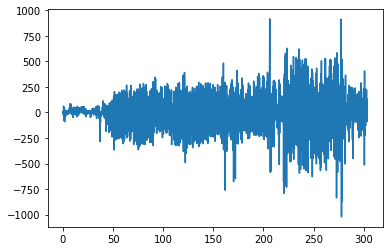

In [178]:
# plot example ppg time signal
ts = np.arange(0, 1/fs * len(ppg), 1/fs)
plt.plot(ts, ppg)

In [179]:
window_width_data_points = 8 * fs
window_overlap = 2 * fs

Text(0, 0.5, 'Frequency (Hz)')

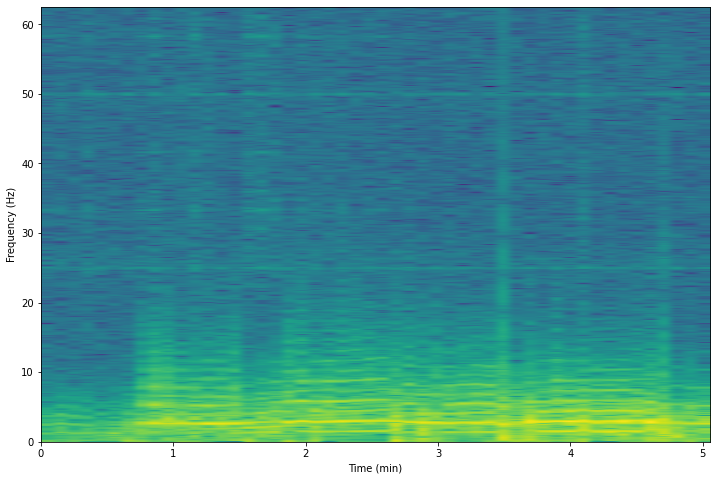

In [180]:
# plot ppg spectogram
plt.figure(figsize=(12,8))
plt.specgram(ppg, Fs=fs, NFFT=window_width_data_points, noverlap=window_overlap, xextent=[0, len(ppg) / fs / 60]);
plt.xlabel('Time (min)')
plt.ylabel('Frequency (Hz)')
#plt.axis(ymin=0, ymax=5)

### Accelorator signal

In [181]:
# get the combined magnitude of the 3 accelorator axis
acc_mag = np.sqrt(np.sum([np.square(accx), np.square(accy), np.square(accz)], axis=0))

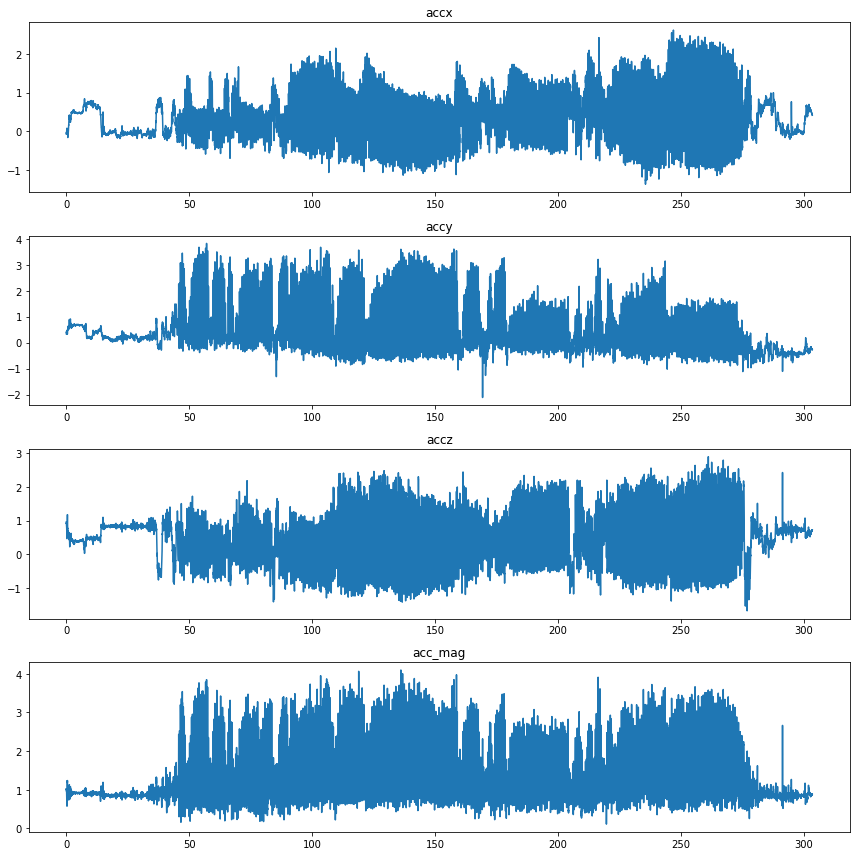

In [182]:
# plott time signal in 3 axis and combined
ts = np.arange(0, 1/fs * len(ppg), 1/fs)
f, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 12))
ax1.plot(ts, accx)
ax1.set_title('accx')
ax2.plot(ts, accy)
ax2.set_title('accy')
ax3.plot(ts, accz)
ax3.set_title('accz')
ax4.plot(ts, acc_mag)
ax4.set_title('acc_mag')
plt.tight_layout()

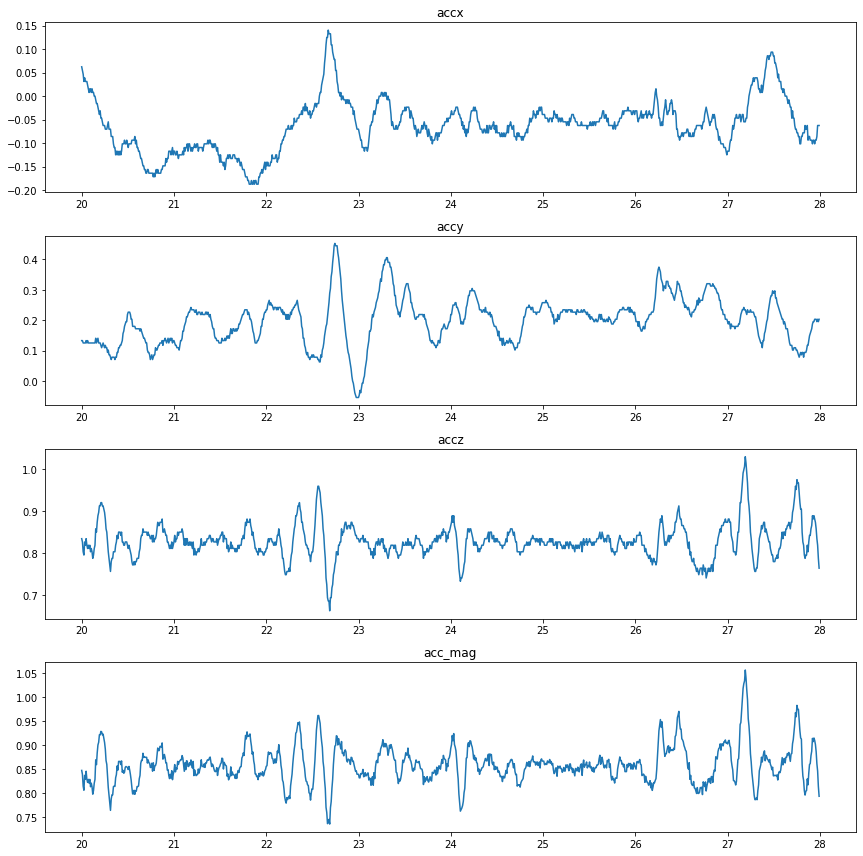

In [183]:
# plot time signal in specific window for closer inspection
window_index = 10

start_index = window_overlap * window_index
end_index = window_overlap * window_index + window_width_data_points

f, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 12))
ts_window = ts[start_index:end_index]
ax1.plot(ts_window, accx[start_index:end_index])
ax1.set_title('accx')
ax2.plot(ts_window, accy[start_index:end_index])
ax2.set_title('accy')
ax3.plot(ts_window, accz[start_index:end_index])
ax3.set_title('accz')
ax4.plot(ts_window, acc_mag[start_index:end_index])
ax4.set_title('acc_mag')
plt.tight_layout()

Text(0, 0.5, 'Frequency (Hz)')

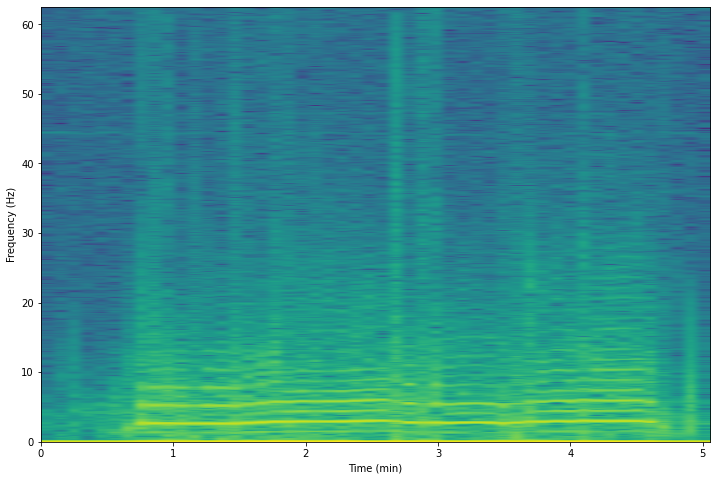

In [184]:
# plot spectogram for acc 
plt.figure(figsize=(12,8))

plt.specgram(acc_mag, Fs=fs, NFFT=window_width_data_points, noverlap=window_overlap, xextent=[0, len(acc_mag) / fs / 60]);
plt.xlabel('Time (min)')
plt.ylabel('Frequency (Hz)')

### Compare signals

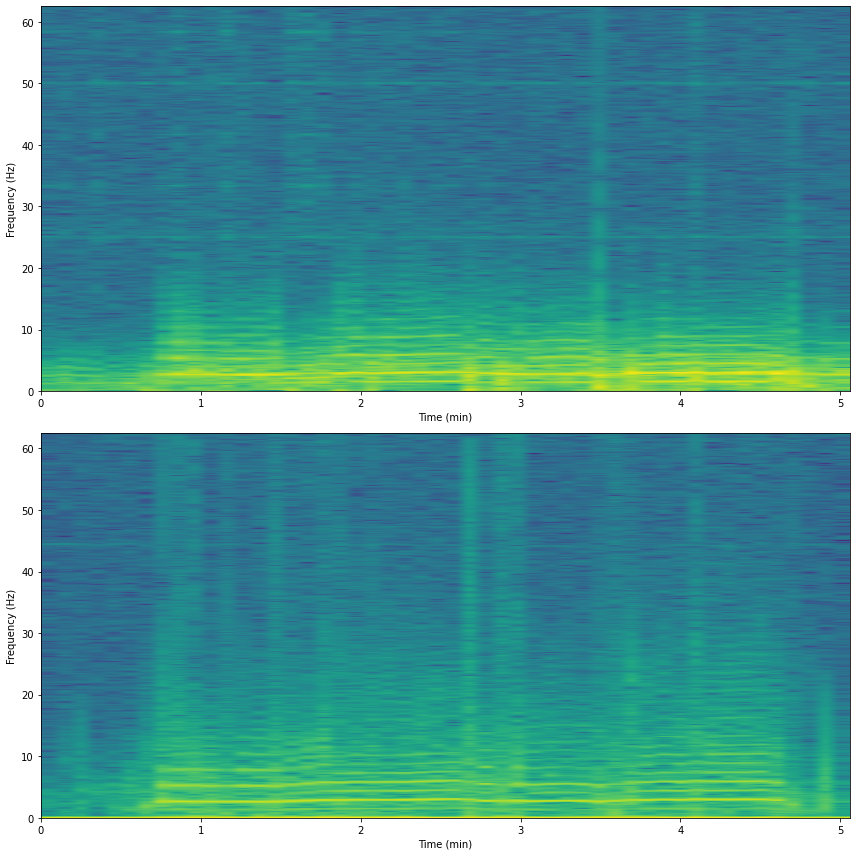

In [185]:
# compare spectorgrams
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))

ax1.specgram(ppg, Fs=fs, NFFT=window_width_data_points, noverlap=window_overlap, xextent=[0, len(ppg) / fs / 60]);
ax1.set(xlabel='Time (min)', ylabel='Frequency (Hz)')

ax2.specgram(acc_mag, Fs=fs, NFFT=window_width_data_points, noverlap=window_overlap, xextent=[0, len(acc_mag) / fs / 60]);
ax2.set(xlabel='Time (min)', ylabel='Frequency (Hz)')

plt.tight_layout()

In [186]:
window_width_data_points, window_overlap

(1000, 250)

In [187]:
def compare_frequ_windows(window_start_time_sec, ppg, acc):
    """
    Visualizes fft frequences of ppg and acc signal for a given time window specified by the start second.
    
    Args:
      window_start_time_sec:  
      ppg: ppg signal
      acc: accelerometer signal

    Returns:
    """
    window_index = int(window_start_time_sec / 2)

    start_index = window_overlap * window_index
    end_index = window_overlap * window_index + window_width_data_points

    f, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))

    ppg_window = ppg[start_index:end_index]
    ppg_fft_window = np.fft.rfft(ppg_window)
    ppg_freq_window = np.fft.rfftfreq(len(ppg_window), 1/fs)
    ax1.plot(ppg_freq_window[:40], np.abs(ppg_fft_window)[:40])
    ax1.set(xlabel='Frequency (Hz)', title='PPG')


    acc_window = acc[start_index:end_index]
    acc_fft_window = np.fft.rfft(acc_window)
    acc_freq_window = np.fft.rfftfreq(len(acc_window), 1/fs)
    ax2.plot(acc_freq_window[:40], np.abs(acc_fft_window)[:40])
    ax2.set(xlabel='Frequency (Hz)', title='ACC')


    plt.tight_layout()

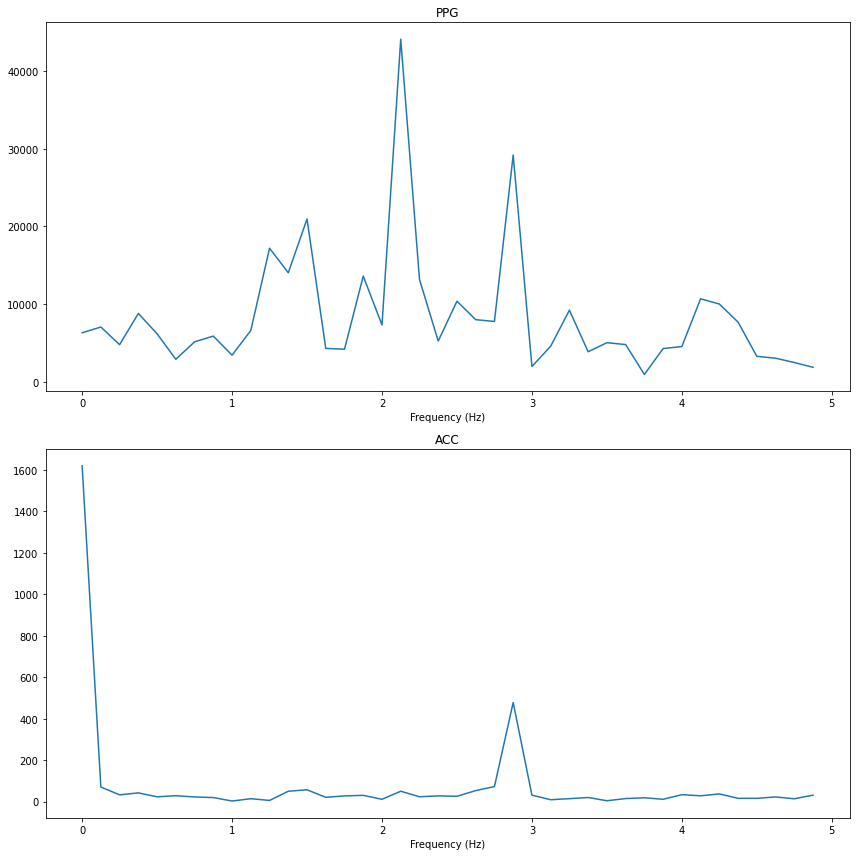

In [188]:
compare_frequ_windows(100, ppg, acc_mag)

### Preprocessing

* Bandpass filter on ppg signal - 40-240bpm => 2/3hz - 4hz

In [189]:
def BandpassFilter(signal, pass_band, fs):
    """Bandpass Filter. (from exercises)
    
    Args:
        signal: (np.array) The input signal
        pass_band: (tuple) The pass band. Frequency components outside 
            the two elements in the tuple will be removed.
        fs: (number) The sampling rate of <signal>
        
    Returns:
        (np.array) The filtered signal
    """
    b, a = sp.signal.butter(3, pass_band, btype='bandpass', fs=fs)
    return sp.signal.filtfilt(b, a, signal)

Text(0, 0.5, 'Frequency (Hz)')

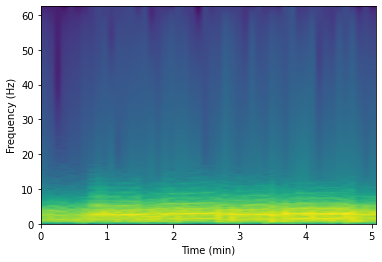

In [190]:
# Bandpass filter and spectogram for ppg
min_frequ = 40 / 60
max_frequ = 240 / 60

ppg_filtered = BandpassFilter(ppg, (min_frequ, max_frequ), fs=fs)
plt.specgram(ppg_filtered, Fs=fs, NFFT=window_width_data_points, noverlap=window_overlap, xextent=[0, len(ppg_filtered) / fs / 60]);
plt.xlabel('Time (min)')
plt.ylabel('Frequency (Hz)')

Text(0, 0.5, 'Frequency (Hz)')

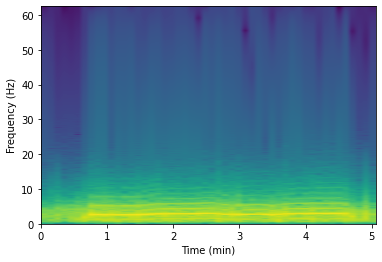

In [191]:
# Bandpass filter and spectogram for accelerometer
acc_filtered = BandpassFilter(acc_mag, (min_frequ, max_frequ), fs=fs)
plt.specgram(acc_filtered, Fs=fs, NFFT=window_width_data_points, noverlap=window_overlap, xextent=[0, len(acc_filtered) / fs / 60]);
plt.xlabel('Time (min)')
plt.ylabel('Frequency (Hz)')

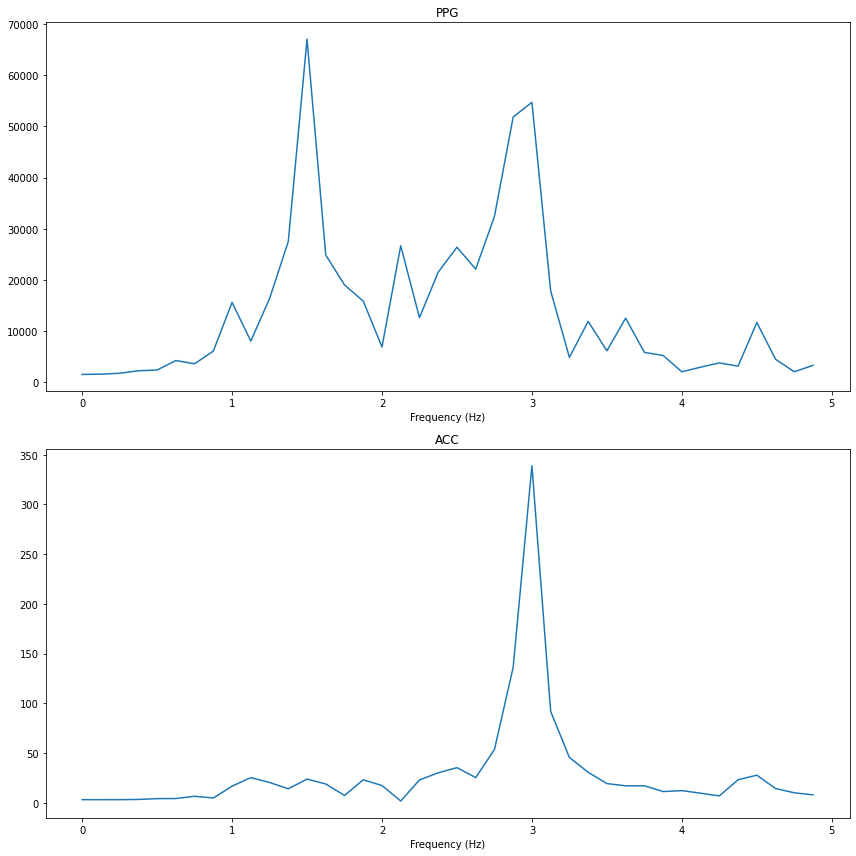

In [192]:
compare_frequ_windows(250, ppg_filtered, acc_filtered)

## Algorithms

### Approach A - Primary peak

* For each time window
    * Get fourier transform of ppg
    * Return strongest frequency

    

In [229]:
def get_bpm_simple(ppg_window):
    """
    Simple bpm estimate by using primary frequency of ppg signal 
    
    Args:
        ppg_window: ppg signal for input window
        
    Returns:
        primary ppg frequency in bpm
    """
    
    # fft ppg
    ppg_freq_window = np.fft.rfftfreq(len(ppg_window), 1/fs)
    ppg_fft_window = np.fft.rfft(ppg_window)
    ppg_fft_mag_window = np.abs(ppg_fft_window)
    
    # get max frequency + bpm
    ppg_mag_max_window = np.max(ppg_fft_mag_window)
    ppg_mag_max_frequ_window = ppg_freq_window[np.argmax(ppg_fft_mag_window)]
    ppg_mag_max_bpm_window = ppg_mag_max_frequ_window * 60
    
    return ppg_mag_max_bpm_window

In [230]:
# example call
window_index = 5
start_index = window_overlap * window_index
end_index = window_overlap * window_index + window_width_data_points
    
ppg_window = ppg_filtered[start_index:end_index]
acc_window = acc_filtered[start_index:end_index]

get_bpm_simple(ppg_window)

67.5

In [232]:
# apply to complete file and get mae
# not a bad attempt but quite high mae
predictions = []
acc_bpm = []
for window_index in range(len(bpm_gt)):
    start_index = window_overlap * window_index
    end_index = window_overlap * window_index + window_width_data_points
    
    ppg_window = ppg_filtered[start_index:end_index]
    acc_window = acc_filtered[start_index:end_index]
    ppg_mag_max_bpm_window = get_bpm_simple(ppg_window)
    
    predictions.append(ppg_mag_max_bpm_window)
    
mae = np.mean(np.abs(predictions - bpm_gt[:,0]))
mae

23.86831543360162

### Approach B - Acc comparison + alternative ppg peaks
  
See for detailed description in summary

#### Calculate confidence
* Fraction of energy in the ppg signal around a given peak


In [197]:
# for confidence calculation
def peak_energy(fft_mag_window, freq_window, peak_hz, peak_band_hz):
    """
    Calculates the energy fraction in the signal around the given peak. 
    
    Args:
        fft_mag_window: fft magnitutes in the window
        freq_window: frequencies in the window
        peak_hz: frequency of peak to calculate the energy for
        peak_band_hz: band in hz around the peak to calculate the energy
        
    """
    
    peak_band = (freq_window > (peak_hz - peak_band_hz)) &  (freq_window < (peak_hz + peak_band_hz))
    energy_frac = np.sum(fft_mag_window[peak_band]) / np.sum(fft_mag_window)
    return energy_frac

In [198]:
# test
ppg_freq_window = np.fft.rfftfreq(len(ppg_window), 1/fs)
ppg_fft_window = np.fft.rfft(ppg_window)
ppg_fft_mag_window = np.abs(ppg_fft_window)

peak_energy(ppg_fft_mag_window, ppg_freq_window, 1.2, 0.5)

0.11321556242512715

In [199]:
def get_peak_candidates(ppg_fft_abs_window, min_fraction, min_distance_hz):
    """
    Get alternative candidates for the puls frequency based on two conditions:
    * Theire magnitude has to be min_fraction of the primary frequency
    * They have to be min_distance_hz away from the primary frequency
    
    Args:
        ppg_fft_abs_window: absolute ppg fft signal
        min_fraction: minimal magnitude fraction of candidate frequencies 
        min_distance_hz: minimal distance of candidate frequencies to primary frequency
        
    Returns:
        A sorted list of tuples (index, mag) of filtered candidates
    """
    
    # get peaks
    pks_index = sp.signal.find_peaks(ppg_fft_abs_window)[0]
    pks_mag = ppg_fft_abs_window[pks_index]

    sorted_peaks = sorted(zip(pks_index,pks_mag), key = lambda x: x[1], reverse=True)
    
    # filter for min fraction
    max_peak_mag = sorted_peaks[0][1]
    max_peak_index = sorted_peaks[0][0]
    sorted_peaks_filtered = list(filter(lambda x: x[1]/max_peak_mag > min_fraction, sorted_peaks))
    #print(sorted_peaks_filtered)

    # filter for min distance
    min_distance_index = min_distance_hz / 0.125
    sorted_peaks_filtered_dist = list(filter(lambda x: np.abs(x[0]-max_peak_index) > min_distance_index, sorted_peaks_filtered))
    #print(sorted_peaks_filtered_dist)
    
    return sorted_peaks_filtered_dist


In [200]:
# Test
min_fraction = 0.2
min_distance_hz = 0.2
get_peak_candidates(ppg_fft_mag_window, min_fraction, min_distance_hz)

[(26, 19890.308412806135),
 (15, 16333.802486942135),
 (11, 14457.493336252985),
 (18, 13872.098923564916),
 (28, 13476.482599286242)]

In [201]:
def get_alternative_cand_peaks(ppg_fft_mag_window, acc_fft_mag_window, freq_window, min_rel_mag, peak_band_hz):
    """
    Wrapper around get_peak_candidates with the same signature as get_alternative_cand_norm_diff in order to
    be interchangable in get_bpm.  
    
    Args:
        ppg_fft_abs_window: absolute ppg fft signal
        acc_fft_mag_window: absolute acc fft signal
        freq_window: frequencies in the window
        min_rel_mag: minimal magnitude fraction of candidate frequencies 
        peak_band_hz: minimal distance of candidate frequencies to primary frequency
        
    Returns:
        Frequency of most probable alternative candidate or None if no candidates fullfils the criteria
    """
    pk_cands = get_peak_candidates(ppg_fft_mag_window, min_rel_mag, peak_band_hz)
    if pk_cands:
        pk_alt_index = pk_cands[0][0]
        alt_cand_frequ = freq_window[pk_alt_index]
    else:
        alt_cand_frequ = None
    return alt_cand_frequ

In [202]:
def get_bpm(ppg_window, acc_window, get_alternative_cand,
                peak_band_hz = 0.25, acc_peak_energy_limit = 0.3, min_rel_mag = 0.8):
    """
    Main base function to calculate pulse estimates. Based on ppg and accelerometer signals in the given window,
    it calculates the primary ppg frequency and checks if it coincides with the primary acc frequency
    (the acc peak is within peak_band_hz of the ppg peak and the energy around the acc peak > acc_peak_energy_limit).
    At the same time it also gets an alternative frequency provided by the get_alternative_cand.
    If primary ppg and acc frequency coincide and there is a suitable candidate frequency, this candidate frequency is
    returned; otherwise the primary ppg frequency is returned. 
    
    Args:
        ppg_window: absolute ppg fft signal
        acc_window: absolute acc fft signal
        get_alternative_cand: function to provide alternative candidates with the signature 
            (ppg_fft_mag_window, acc_fft_mag_window, freq_window, min_rel_mag, peak_band_hz)
        peak_band_hz: defines the distance around the primary ppg frequency to check for the acc peak and where alternative
                    ppg candidates are exluded.
        acc_peak_energy_limit: the minimal energy fraction the area around the primary acc frequency needs to have in
                                order to be considered a cause for the primary ppg frequency.
        min_rel_mag: minimal magnitude fraction of candidate frequencies 
        
    Returns:
        Tuple (pred_bpm, pred_confidence, alt_cand_frequ)
        pred_bpm: predicted pulse rate estimate in beats per minute
        pred_confidence: confidence of the pulse rate estimate
        alt_cand_frequ: alternative candidate frequency if available, otherwise None
    """
    
    freq_window = np.fft.rfftfreq(len(ppg_window), 1/fs)
    
    # fft ppg
    ppg_fft_window = np.fft.rfft(ppg_window)
    ppg_fft_mag_window = np.abs(ppg_fft_window)
    
    # get ppg max frequency + bpm
    ppg_mag_max_window = np.max(ppg_fft_mag_window)
    ppg_mag_max_frequ_window = freq_window[np.argmax(ppg_fft_mag_window)]
    ppg_mag_max_bpm_window = ppg_mag_max_frequ_window * 60
    ppg_mag_at_max = ppg_fft_mag_window[np.argmax(ppg_fft_mag_window)]
    
    # fft acc
    acc_fft_window = np.fft.rfft(acc_window)
    acc_fft_mag_window = np.abs(acc_fft_window)

    # get ppg max frequency + bpm 
    acc_mag_max_window = np.max(acc_fft_mag_window)
    acc_mag_max_frequ_window = freq_window[np.argmax(acc_fft_mag_window)]
    acc_mag_max_bpm_window = acc_mag_max_frequ_window * 60

    # get ppg alternative candidates
    alt_cand_frequ = get_alternative_cand(ppg_fft_mag_window, acc_fft_mag_window, freq_window, min_rel_mag, peak_band_hz)
     
    # is primary ppg peak in range of acc peak?
    close_to_acc_peak = np.abs(ppg_mag_max_frequ_window - acc_mag_max_frequ_window) < (peak_band_hz)    

    # what is the energy of this acc peak?
    acc_peak_band_energy = peak_energy(acc_fft_mag_window, freq_window, ppg_mag_max_frequ_window, peak_band_hz)
    high_acc_peak_band_energy = acc_peak_band_energy > acc_peak_energy_limit
    
    # is the alternative peak high enough?
    alt_peak_high_enough = False
    if alt_cand_frequ:
        ppg_mag_at_alt_cand = ppg_fft_mag_window[np.argwhere(freq_window == alt_cand_frequ)[0][0]]
        alt_peak_high_enough = (ppg_mag_at_alt_cand / ppg_mag_at_max) > min_rel_mag
    
    # should we take other ppg frequency?
    if close_to_acc_peak and high_acc_peak_band_energy and alt_peak_high_enough:
        pred_frequ = alt_cand_frequ
    else:
        pred_frequ = ppg_mag_max_frequ_window
    pred_bpm = pred_frequ * 60
    
    # get confidence
    pred_confidence = peak_energy(ppg_fft_mag_window, freq_window, pred_frequ, peak_band_hz)
    
    return pred_bpm, pred_confidence, alt_cand_frequ

In [203]:
get_bpm(ppg_window, acc_window, get_alternative_cand_peaks)

(157.5, 0.19428741934390478, None)

### Approach C - Normalized PPG and ACC difference
See for detailed description in summary

In [204]:
def normalize_sig(signal):
    """
    Returns a normalized signal in [0,1]
    """
    return (signal - np.min(signal)) / np.max(signal)

In [205]:
def get_alternative_cand_norm_diff(ppg_fft_mag_window, acc_fft_mag_window, freq_window, min_rel_mag, peak_band_hz):
    """
    An alternative way to calculate pulse rate estimate candidates. Here we return the 
    primary frequency of the difference of normalized ppg and acc ffts.  
    
    Args:
        ppg_fft_abs_window: absolute ppg fft signal
        acc_fft_mag_window: absolute acc fft signal
        freq_window: frequencies in the window
        min_rel_mag: minimal magnitude fraction of candidate frequencies 
        peak_band_hz: minimal distance of candidate frequencies to primary frequency
        
    Returns:
        Primary frequency of the difference of normalized ppg and acc ffts
    """
    ppg_fft_mag_window_norm = normalize_sig(ppg_fft_mag_window)
    acc_fft_mag_window_norm = normalize_sig(acc_fft_mag_window)

    # get diff of ppg and acc
    diff_fft_mag = ppg_fft_mag_window - acc_fft_mag_window

    diff_mag_max = np.max(diff_fft_mag)
    diff_mag_max_frequ = freq_window[np.argmax(diff_fft_mag)]
        
    return diff_mag_max_frequ

In [206]:
get_bpm(ppg_window, acc_window, get_alternative_cand_norm_diff)

(157.5, 0.19428741934390478, 2.625)

## Evaluation

### Evaluate on single file

In [207]:
def evaluate(ppg_filtered, acc_filtered, bpm_gt, alternative_cand_func, window_widths_seconds = 16, window_overlap_seconds = 2, 
             peak_band_hz = 0.3, acc_peak_energy_limit = 0.2, min_rel_mag = 0.6):
    
    """
    Applies the algorithm to all windows in the given signal (as defined by the parameter)
    and returns metrics and raw predictions plus errors.
    
    Args:
        ppg_filtered: filtered ppg signal
        acc_filtered: filtered acc signal
        bpm_gt: pulse rate ground truth in bpm
        get_alternative_cand: function to provide alternative candidates with the signature 
            (ppg_fft_mag_window, acc_fft_mag_window, freq_window, min_rel_mag, peak_band_hz)
        window_widths_seconds: defines the length of each signal window to do the estimates
        window_overlap_seconds: defines the overlap of subsequent windows.
        peak_band_hz: defines the distance around the primary ppg frequency to check for the acc peak and where alternative
                    ppg candidates are exluded.
        acc_peak_energy_limit: the minimal energy fraction the area around the primary acc frequency needs to have in
                                order to be considered a cause for the primary ppg frequency.
        min_rel_mag: minimal magnitude fraction of candidate frequencies 
        
    Returns:
        Tuple (mae_pred, mae_pred_90, predictions,  predictions_conf, error_abs)
        mae_pred: mean absolute prediction error
        mae_pred_90: mean absolute prediction error at 90% availability
        predictions: array of predicted pulse rate estimates in beats per minute
        predictions_conf: array of confidence of predictions
        error_abs: array with absolute error of predictions
    """
    
    window_width_data_points = window_widths_seconds * fs
    window_overlap = window_overlap_seconds * fs

    predictions = []
    predictions_conf = []
    for window_index in range(len(bpm_gt)):
        start_index = window_overlap * window_index
        end_index = window_overlap * window_index + window_width_data_points

        ppg_window = ppg_filtered[start_index:end_index]
        acc_window = acc_filtered[start_index:end_index]
        pred_bpm, pred_confidence, alt_cand_frequ = get_bpm(ppg_window, acc_window, alternative_cand_func,
                                                            peak_band_hz, acc_peak_energy_limit, min_rel_mag)

        predictions.append(pred_bpm)
        predictions_conf.append(pred_confidence)
    
    error_abs = np.abs(predictions - bpm_gt[:,0])
    mae_pred = np.mean(np.abs(predictions - bpm_gt[:,0]))
    
    combined = zip(predictions,predictions_conf,bpm_gt[:,0])
    combined_sorted = sorted(combined, key = lambda x: x[1], reverse = True)
    combined_90 = combined_sorted[:int(np.round(len(combined_sorted) * 0.9))]
    mae_pred_90 = np.mean([np.abs(pred-gt) for pred, conf, gt in combined_90])
    #sorted_errors = np.sort(np.abs(predictions - bpm_gt[:,0]))
    #mae_pred_90 = np.mean(sorted_errors[:int(len(sorted_errors) * 0.9)])
    
    return mae_pred, mae_pred_90, predictions,  predictions_conf, error_abs

In [208]:
window_widths_seconds = 16
peak_band_hz = 0.25
acc_peak_energy_limit = 0.3
min_rel_mag = 0.8

#alternative_cand_func = get_alternative_cand_norm_diff
alternative_cand_func = get_alternative_cand_peaks


mae_pred, mae_pred_90, predictions,  predictions_conf, error_abs = evaluate(ppg_filtered, acc_filtered, bpm_gt, alternative_cand_func, window_widths_seconds = window_widths_seconds, 
             peak_band_hz = peak_band_hz, acc_peak_energy_limit = acc_peak_energy_limit, min_rel_mag = min_rel_mag)

mae_pred, mae_pred_90

(24.11927386772979, 24.393819023600855)

#### Hyperparameter tuning

In [209]:
# hyperparameter tuning
window_widths_seconds_range = (8, 16)
peak_band_hz_range = np.arange(0.1, 1, 0.1)
acc_peak_energy_limit_range = np.arange(0.01,0.2,0.02)
min_rel_mag_range = np.arange(0.2,0.9,0.1)
alternative_cand_func_range = [get_alternative_cand_peaks, get_alternative_cand_norm_diff]

In [210]:
performances = []
for peak_band_hz in peak_band_hz_range:
    for acc_peak_energy_limit in acc_peak_energy_limit_range:
        for min_rel_mag in min_rel_mag_range:
            for window_widths_seconds in window_widths_seconds_range:
                for alternative_cand_func in [get_alternative_cand_peaks, get_alternative_cand_norm_diff]:
                    mae_pred, mae_pred_90, predictions, predictions_conf, error_abs = evaluate(ppg_filtered,
                         acc_filtered, bpm_gt, alternative_cand_func, window_widths_seconds = window_widths_seconds, 
                         peak_band_hz = peak_band_hz, acc_peak_energy_limit = acc_peak_energy_limit, min_rel_mag = min_rel_mag)
                    performances.append(((window_widths_seconds, acc_peak_band_hz, acc_peak_energy_limit, min_rel_mag, alternative_cand_func),
                                         (mae_pred, mae_pred_90)))

In [211]:
len(performances)

2520

In [212]:
performances.sort(key = lambda x: x[1][1])
performances[-2:]

[((8,
   0.25,
   0.16999999999999998,
   0.2,
   <function __main__.get_alternative_cand_peaks(ppg_fft_mag_window, acc_fft_mag_window, freq_window, min_rel_mag, peak_band_hz)>),
  (55.856435814639035, 55.45508873675526)),
 ((8,
   0.25,
   0.18999999999999997,
   0.2,
   <function __main__.get_alternative_cand_peaks(ppg_fft_mag_window, acc_fft_mag_window, freq_window, min_rel_mag, peak_band_hz)>),
  (55.856435814639035, 55.45508873675526))]

In [213]:
performances[:3]

[((8,
   0.25,
   0.01,
   0.7000000000000002,
   <function __main__.get_alternative_cand_peaks(ppg_fft_mag_window, acc_fft_mag_window, freq_window, min_rel_mag, peak_band_hz)>),
  (25.78567941874727, 22.090886221461638)),
 ((8,
   0.25,
   0.03,
   0.7000000000000002,
   <function __main__.get_alternative_cand_peaks(ppg_fft_mag_window, acc_fft_mag_window, freq_window, min_rel_mag, peak_band_hz)>),
  (25.78567941874727, 22.090886221461638)),
 ((8,
   0.25,
   0.049999999999999996,
   0.7000000000000002,
   <function __main__.get_alternative_cand_peaks(ppg_fft_mag_window, acc_fft_mag_window, freq_window, min_rel_mag, peak_band_hz)>),
  (25.78567941874727, 22.090886221461638))]

#### Visualize signal and predictions

In [214]:
def compare_difference(window_index, window_widths_seconds, ppg, acc, bpm_gt, get_alternative_cand,
                       peak_band_hz, acc_peak_energy_limit, min_rel_mag):

    """
    Visualizes the ppg, acc and normalized difference signal. In each the primary frequences are marked plus 
    the ground truth. 
    
    Args:
        window_widths_seconds: defines the length of each signal window to do the estimates
        window_overlap_seconds: defines the overlap of subsequent windows.
        ppg: ppg signal
        acc: acc signal
        bpm_gt: pulse rate ground truth in bpm
        get_alternative_cand: function to provide alternative candidates with the signature 
            (ppg_fft_mag_window, acc_fft_mag_window, freq_window, min_rel_mag, peak_band_hz)
        peak_band_hz: defines the distance around the primary ppg frequency to check for the acc peak and where alternative
                    ppg candidates are exluded.
        acc_peak_energy_limit: the minimal energy fraction the area around the primary acc frequency needs to have in
                                order to be considered a cause for the primary ppg frequency.
        min_rel_mag: minimal magnitude fraction of candidate frequencies 
        
    """
    
    window_width_data_points = window_widths_seconds * fs
    start_index = window_overlap * window_index
    end_index = window_overlap * window_index + window_width_data_points
    plot_end_index = 40
    
    ppg_window = ppg[start_index:end_index]
    acc_window = acc[start_index:end_index]
    frequ_window = np.fft.rfftfreq(len(ppg_window), 1/fs)    

    #pred_bpm, diff_mag_max_bpm, ppg_mag_max_bpm_window, acc_mag_max_bpm_window = get_bpm_norm_diff(ppg_window, acc_window, acc_peak_band_hz, acc_peak_energy_limit, acc_weight, min_rel_mag)
    
    pred_bpm, pred_confidence, alt_cand_frequ = get_bpm(ppg_window, acc_window, get_alternative_cand,
                                                        peak_band_hz, acc_peak_energy_limit, min_rel_mag)
    
    pred_index = np.argwhere(frequ_window==pred_bpm / 60)[0][0]
    if alt_cand_frequ:
        alt_cand_index = np.argwhere(frequ_window==alt_cand_frequ)[0][0]
        alt_cand_bpm = alt_cand_frequ/60
    else:
        alt_cand_index = 0
        alt_cand_bpm = 0
    
    gt_frequ = bpm_gt[window_index] / 60
    bpm_gt_index = (np.abs(frequ_window - gt_frequ)).argmin()
    
    f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 12))    

    # plot ppg
    ppg_fft_window = np.fft.rfft(ppg_window)
    ppg_fft_abs_window = np.abs(ppg_fft_window)
    ppg_fft_abs_window = normalize_sig(ppg_fft_abs_window)    
    ppg_mag_max_index = np.argmax(ppg_fft_abs_window)
    
    ax1.plot(frequ_window[:plot_end_index], ppg_fft_abs_window[:plot_end_index])
    ax1.plot(frequ_window[ppg_mag_max_index], ppg_fft_abs_window[ppg_mag_max_index], "x")
    ax1.plot(frequ_window[pred_index], ppg_fft_abs_window[pred_index], ".")
    ax1.plot(frequ_window[bpm_gt_index], ppg_fft_abs_window[bpm_gt_index], "s")
    ax1.set(xlabel='Frequency (Hz)', title='PPG')

    # plot acc
    acc_fft_window = np.fft.rfft(acc_window)
    acc_fft_abs_window = np.abs(acc_fft_window)
    acc_fft_abs_window = normalize_sig(acc_fft_abs_window)    
    acc_mag_max_index = np.argmax(acc_fft_abs_window)
        
    ax2.plot(frequ_window[:plot_end_index], acc_fft_abs_window[:plot_end_index])
    ax2.plot(frequ_window[acc_mag_max_index], acc_fft_abs_window[acc_mag_max_index], "x")
    ax2.set(xlabel='Frequency (Hz)', title='ACC')

    # plot diff   
    diff_fft_window = ppg_fft_abs_window - acc_fft_abs_window
    diff_mag_max_index = np.argmax(diff_fft_window)
    
    ax3.plot(frequ_window[:plot_end_index], diff_fft_window[:plot_end_index])
    ax3.plot(frequ_window[diff_mag_max_index], diff_fft_window[diff_mag_max_index], "x")
    ax3.plot(frequ_window[bpm_gt_index], diff_fft_window[bpm_gt_index], "s")

    ax3.set(xlabel='Frequency (Hz)', title='Diff')

    plt.tight_layout()
    
    print(pred_bpm, pred_confidence, alt_cand_bpm, ppg_mag_max_bpm_window, acc_mag_max_bpm_window)
    print(bpm_gt[window_index])

In [215]:
# best combination
window_widths_seconds = 8
peak_band_hz = 0.25
acc_peak_energy_limit = 0.05
min_rel_mag = 0.7

alternative_cand_func = get_alternative_cand_peaks

In [216]:
mae_pred, mae_pred_90, predictions,  predictions_conf, error_abs = evaluate(ppg_filtered, acc_filtered, bpm_gt, alternative_cand_func, window_widths_seconds = window_widths_seconds, 
             peak_band_hz = peak_band_hz, acc_peak_energy_limit = acc_peak_energy_limit, min_rel_mag = min_rel_mag)


In [217]:
# get failed predicitons for inspection
failed = error_abs > 15
failed_indices = np.where(failed)

np.concatenate([failed_indices[0][:,np.newaxis], error_abs[failed,np.newaxis]], axis= 1)


array([[ 10.        ,  34.5990566 ],
       [ 18.        ,  15.37292818],
       [ 22.        ,  66.54079383],
       [ 23.        ,  64.62074303],
       [ 24.        ,  62.76315789],
       [ 25.        ,  60.21226415],
       [ 26.        ,  57.83222591],
       [ 27.        ,  55.91986456],
       [ 28.        ,  54.65189873],
       [ 29.        ,  54.05172414],
       [ 30.        ,  54.32539683],
       [ 31.        ,  54.54329461],
       [ 32.        ,  54.21610169],
       [ 33.        ,  53.44450374],
       [ 34.        ,  43.79084967],
       [ 35.        ,  41.41675284],
       [ 36.        ,  46.83030647],
       [ 37.        ,  45.91657811],
       [ 38.        ,  45.20053476],
       [ 39.        ,  44.71804511],
       [ 40.        ,  43.86363636],
       [ 41.        ,  42.99618321],
       [ 42.        ,  42.36842105],
       [ 43.        ,  33.97790055],
       [ 44.        ,  32.94314381],
       [ 48.        ,  41.46694215],
       [ 53.        ,  29.50584485],
 

157.5 0.2911465292305183 0 157.5 97.5
[104.05549626]
[103.28389831] [106.20915033]


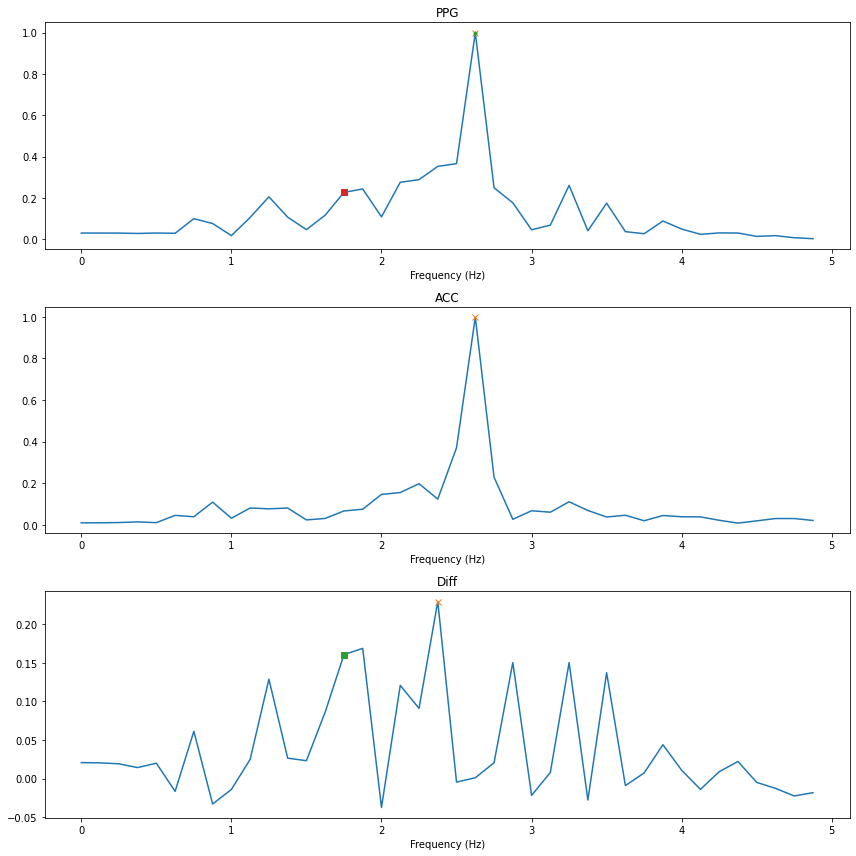

In [218]:
index = 33

compare_difference(index, window_widths_seconds, ppg_filtered, acc_filtered, bpm_gt, alternativ_cand_func, peak_band_hz, acc_peak_energy_limit, min_rel_mag)
print(bpm_gt[index-1],bpm_gt[index+1])

45.0 0.11332077356897972 0.0125 157.5 97.5
[79.5990566]
[76.8442623] [79.11392405]


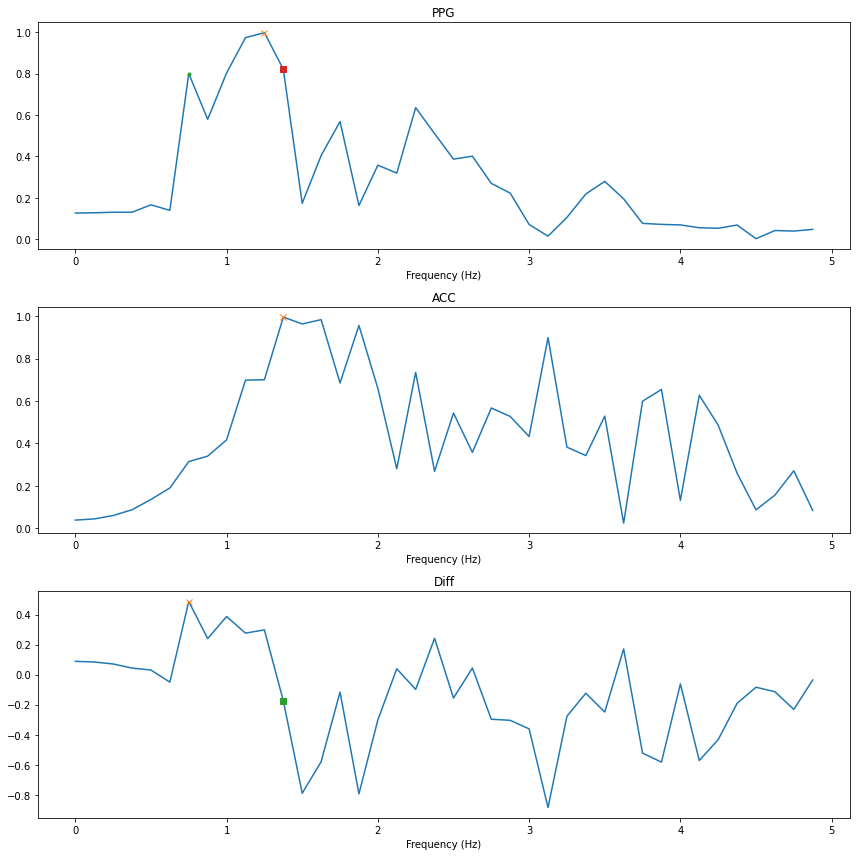

In [219]:
index = 10

compare_difference(index, window_widths_seconds, ppg_filtered, acc_filtered, bpm_gt, alternativ_cand_func, peak_band_hz, acc_peak_energy_limit, min_rel_mag)
print(bpm_gt[index-1],bpm_gt[index+1])

90.0 0.11958874319821353 0.025 157.5 97.5
[163.21243523]
[162.86644951] [163.72141372]


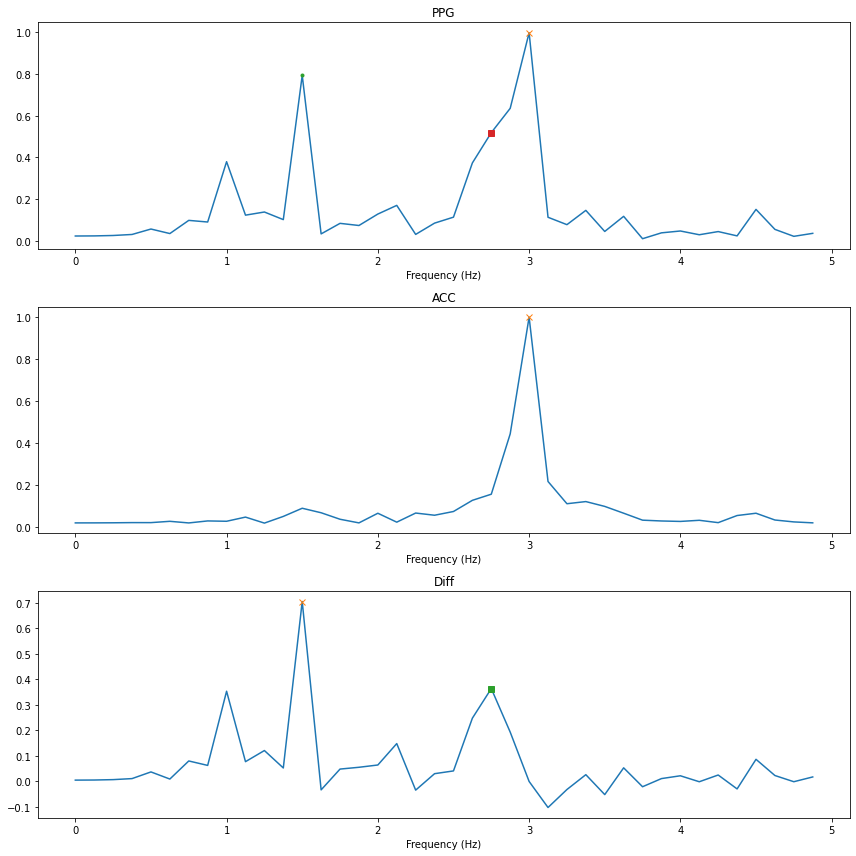

In [220]:
index = 129

compare_difference(index, window_widths_seconds, ppg_filtered, acc_filtered, bpm_gt, alternativ_cand_func, peak_band_hz, acc_peak_energy_limit, min_rel_mag)
print(bpm_gt[index-1],bpm_gt[index+1])

### Evaluate on all files to get final performance estimate

In [221]:
# apply best configuration to multiple files

In [222]:
# best combination
window_widths_seconds = 8
peak_band_hz = 0.25
acc_peak_energy_limit = 0.05
min_rel_mag = 0.7

alternative_cand_func = get_alternative_cand_peaks

In [223]:
import glob

import numpy as np
import scipy as sp
import scipy.signal
import scipy.io
from matplotlib import pyplot as plt


def LoadTroikaDataset():
    """
    Retrieve the .mat filenames for the troika dataset.

    Review the README in ./datasets/troika/ to understand the organization of the .mat files.

    Returns:
        data_fls: Names of the .mat files that contain signal data
        ref_fls: Names of the .mat files that contain reference data
        <data_fls> and <ref_fls> are ordered correspondingly, so that ref_fls[5] is the 
            reference data for data_fls[5], etc...
    """
    data_dir = "./datasets/troika/training_data"
    data_fls = sorted(glob.glob(data_dir + "/DATA_*.mat"))
    ref_fls = sorted(glob.glob(data_dir + "/REF_*.mat"))
    return data_fls, ref_fls

def LoadTroikaDataFile(data_fl):
    """
    Loads and extracts signals from a troika data file.

    Usage:
        data_fls, ref_fls = LoadTroikaDataset()
        ppg, accx, accy, accz = LoadTroikaDataFile(data_fls[0])

    Args:
        data_fl: (str) filepath to a troika .mat file.

    Returns:
        numpy arrays for ppg, accx, accy, accz signals.
    """
    data = sp.io.loadmat(data_fl)['sig']
    return data[2:]


def AggregateErrorMetric(pr_errors, confidence_est):
    """
    Computes an aggregate error metric based on confidence estimates.

    Computes the MAE at 90% availability. 

    Args:
        pr_errors: a numpy array of errors between pulse rate estimates and corresponding 
            reference heart rates.
        confidence_est: a numpy array of confidence estimates for each pulse rate
            error.

    Returns:
        the MAE at 90% availability
    """
    # Higher confidence means a better estimate. The best 90% of the estimates
    #    are above the 10th percentile confidence.
    percentile90_confidence = np.percentile(confidence_est, 10)

    # Find the errors of the best pulse rate estimates
    best_estimates = pr_errors[confidence_est >= percentile90_confidence]

    # Return the mean absolute error
    return np.mean(np.abs(best_estimates))



In [224]:
def RunPulseRateAlgorithm(data_fl, ref_fl):
    """
    Applies the pulse rate algorithm to get estimates for the given sensor data and compares them 
    to the given ground truth to return absolute errors plus confidence values for each prediciton.
    A ore detailed descripition of the underlying algorithm can be found in the doc string of get_bpm function.
    
    Args:
        data_fl: mat file containing ppg and acc signals.
        ref_fl: mat file containing pulse ground truth values in bpm

    Returns:
        errors: array of absolute errors per prediction
        confidence: array of confidence values per prediction
    """
    
    # Load data using LoadTroikaDataFile
    ppg, accx, accy, accz = LoadTroikaDataFile(data_fl)
    bpm_gt = sp.io.loadmat(ref_fl)['BPM0']
    
    # combined accerometer signals
    acc_mag = np.sqrt(np.sum([np.square(accx), np.square(accy), np.square(accz)], axis=0))
    
    min_frequ = 40 / 60
    max_frequ = 240 / 60

    ppg_filtered = BandpassFilter(ppg, (min_frequ, max_frequ), fs=fs)
    acc_filtered = BandpassFilter(acc_mag, (min_frequ, max_frequ), fs=fs)

    # Compute pulse rate estimates and estimation confidence.
    mae_pred, mae_pred_90, predictions,  predictions_conf, error_abs = evaluate(ppg_filtered,
            acc_filtered, bpm_gt, alternative_cand_func, window_widths_seconds = window_widths_seconds, 
             peak_band_hz = peak_band_hz, acc_peak_energy_limit = acc_peak_energy_limit, min_rel_mag = min_rel_mag)


    # Return per-estimate mean absolute error and confidence as a 2-tuple of numpy arrays.
    errors, confidence = np.array(error_abs), np.array(predictions_conf)  # Dummy placeholders. Remove
    return errors, confidence

In [225]:
# Overal performance estimate
Evaluate()

25.13674117001503

-----
### Project Write-up

Answer the following prompts to demonstrate understanding of the algorithm you wrote for this specific context.

> - **Code Description** - Include details so someone unfamiliar with your project will know how to run your code and use your algorithm. 
> - **Data Description** - Describe the dataset that was used to train and test the algorithm. Include its short-comings and what data would be required to build a more complete dataset.
> - **Algorithm Description** will include the following:
>   - how the algorithm works
>   - the specific aspects of the physiology that it takes advantage of
>   - a describtion of the algorithm outputs
>   - caveats on algorithm outputs 
>   - common failure modes
> - **Algorithm Performance** - Detail how performance was computed (eg. using cross-validation or train-test split) and what metrics were optimized for. Include error metrics that would be relevant to users of your algorithm. Caveat your performance numbers by acknowledging how generalizable they may or may not be on different datasets.

#### Code Description

The notebook contains code to estimate pulse based on a ppg signal in combination with a three channel accelerometer signal. The main function to run the estimation is RunPulseRateAlgorithm(data_fl, ref_fl), which
in its current form takes a data file containing the ppg and accelerometer signals and a reference file containing a ground truth pulse in beats per minute. If you want to apply the algorithm to data directly to get an estimate, you can use the get_bpm function with a ppg and acc signal and appropriate parameters, which returns the estimated pulse together with a confidence.  

Furthermore, the notebook contains an ETA section with visualizations of the ppg and accelerometer signals, implementations of potential algorithms (simple, peaks, diff) with hyperparameter tuning on a subset of the data and finally the application to the whole data set.


#### Data Description

For evaluating our algorithm we used the Troika dataset. It contains "two-channel PPG signals, three-axis acceleration signals, and one-channel ECG signals which were simultaneously recorded from subjects with age from 18 to 35". Both, ppg ("two pulse oximeters with green LEDs (wavelength: 515nm)") and accelerometer were recorded by a wrist device. The ground truth bpm was recorded from the chest using wet ECG sensors.  All signals were sampled at 125 Hz. All subjects ran on a treadmill with changing speeds.

Two shortcomings of the dataset are related to the setup. First, only subjects from 18 to 35 were used. That means that the error metrics are not necessarily translatable to other age groups. And second, the examples were collected on a treadmill setup. Similar to the age, one would have to collect additional data for other movement scenarios if one would want to apply this algorithm there. 


#### Algorithm Description

We implemented 3 versions of the algorithm. All three in commoh have that we first apply a bandpass filter in the suggested band 40-240bpm. In the first algorithm (get_bpm_simple), we simply return the prominent frequency of the ppg signal. 

The other two algorithms share the following common base (get_bpm): 

* Get absolute magnitude fourier transform of ppg and acc
* For ppg
    * Get primary frequency/peak
    * Get alternative peak candidate (different for two versions)
* For acc
    * Get primary peak
* If 
    * A) ppg primary peak is within a defined range(peak_band_hz) from the acc primary peak and
    * B) the corresponding acc primary peak has an energy fraction of the acc signal bigger than a defined limit (acc_peak_energy_limit)
    * C) the magnitude of the alternative peak is at least a defined fraction of the primary peak magnitude (min_rel_mag) 
* Then return alternative peak with confidence
* Else return primary peak with confidence

The prediction confidence if calculated by taking the energy of the ppg signal around the predicted frequency. 

We implemented two versions to get the alternative candidate:

1. Other peaks in ppg signal (get_peak_candidates). Here, we take other peaks in the ppg signal and filter them by a minimal distance and a minimal magnitude fraction in comparison to the primary peak. 
2. Difference of normalized ppg and acc signals. Here, we return the peak of this difference. 

For all versions we take into account that arm movements can affect the ppg signal as can be seen in close or equal primary frequencies for ppg and accelerometer signals. To counter this we use the conditions A) to see if the peaks are too close and B) to check if the acc peak is relevant (if its energy fraction is small, that overlap might be irrelevant). In a similar fashion we make use of this with our second variant for the alternative candidate generation as we use the difference of the two normalized signals.

The main algorithm get_bpm returns the predicted pulse in beats per minute, the prediction confidence and the frequency of the alternative candidate if it exists. The wrapper RunPulseRateAlgorithm returns two arrays, one with the prediction errors and one with the corresponding confidences.

One main failure mode is when the real pulse coincides with the primary frequency of the accelerometer signal. In this case the algorithm decides in many situations to go falsely for the alternative candidate. 

#### Algorithm Performance

In this case we applied a fairly simple evaluation setup. Since the algorithm did not have to be trained we evaluated the different versions and did hyperparameter tuning on the first data file. And the final performance estimate was then done on all data files. An alternative would be to split all training examples (ppg + acc window, bpm ground truth) randomly in a train set for hyperparameter optimization and a test set to get an unbiased performance estimate. 

In the hyperparameter optimization we optimized for the mean absolute error of the 90% most confident predictions. 
Depending on the use case this might not be the ideal metric. For example, if someone wants to continuously measure their heart rate during sport in order to adjust resistance/difficulty they would rather be interested in the general mean absolute error as decisions are made in realtime. In contrast for a long term study, a 90% availability for more accuracy might be prefered. 

As mentioned in the dataset description, the estimated performance is not necessarily transferable to other age groups or movement scenarios. 


-----
### Next Steps
You will now go to **Test Your Algorithm** (back in the Project Classroom) to apply a unit test to confirm that your algorithm met the success criteria. 